In [1]:
from data_loader_clfcrn import DataLoad_Train
from Model_clFCRN_kernel import Network_clFCRN
import torch
import matplotlib.pyplot as plt
import scipy.io as spio

In [2]:
# Here indicating the GPU you want to use. if you don't have GPU, just leave it.
cuda_available = torch.cuda.is_available()
device = torch.device('cuda:1')
torch.set_default_dtype(torch.float)

In [3]:
sample_length = 2
v_smooth_sigma = 5
data_norm = 1
r_seed = 123
results_path = '../results/'

In [4]:
seismic_data_nor, velocity_nor, velocity_nor_smooth, location_x, location_y = DataLoad_Train(sample_length, 
                                                                                             v_smooth_sigma, 
                                                                                             data_norm, r_seed)

velocity.shape torch.Size([401, 401, 93])
seismic_data.shape torch.Size([401, 401, 93])


In [5]:
pre_seismic_data_label = seismic_data_nor[location_x, location_y, :]
pre_velocity_label = velocity_nor[location_x, location_y, :]

pre_data_size = pre_seismic_data_label.size()
pre_seismic_data_label = pre_seismic_data_label.unsqueeze(1)
pre_velocity_label = pre_velocity_label.unsqueeze(1)

seismic_data_size = seismic_data_nor.size()
seismic_data = seismic_data_nor.reshape(seismic_data_size[0]*seismic_data_size[1], seismic_data_size[2]).unsqueeze(1)

pre_seismic_data_label.shape, pre_velocity_label.shape, seismic_data.shape

(torch.Size([2, 1, 93]), torch.Size([2, 1, 93]), torch.Size([160801, 1, 93]))

In [6]:
in_channels = 1
out_channels = 1
is_batchnorm = False
net = Network_clFCRN(in_channels, out_channels, is_batchnorm)
net.to(device)

Network_clFCRN(
  (encoder): CLFCRN_Encoder(
    (conv): Sequential(
      (0): modelConv1(
        (conv1): Sequential(
          (0): Conv1d(1, 16, kernel_size=(31,), stride=(1,), padding=(15,))
          (1): ReLU(inplace=True)
        )
      )
      (1): modelResBlock(
        (conv1): Sequential(
          (0): Conv1d(16, 16, kernel_size=(31,), stride=(1,), padding=(15,))
          (1): ReLU(inplace=True)
        )
        (conv2): Sequential(
          (0): Conv1d(16, 16, kernel_size=(3,), stride=(1,), padding=(1,))
        )
        (relu): ReLU(inplace=True)
      )
      (2): modelResBlock(
        (conv1): Sequential(
          (0): Conv1d(16, 16, kernel_size=(31,), stride=(1,), padding=(15,))
          (1): ReLU(inplace=True)
        )
        (conv2): Sequential(
          (0): Conv1d(16, 16, kernel_size=(3,), stride=(1,), padding=(1,))
        )
        (relu): ReLU(inplace=True)
      )
      (3): modelResBlock(
        (conv1): Sequential(
          (0): Conv1d(16, 16, 

In [7]:
# Setup optimiser to perform inversion
optimizer = torch.optim.Adam(net.parameters())
loss_fn = torch.nn.L1Loss()
# loss_fn_2 = torch.nn.MSELoss()

0 10.750333786010742
50 3.060192108154297
100 2.5040194988250732
150 2.3387844562530518
200 2.2610645294189453
250 2.2279112339019775
300 2.124473810195923
350 2.0981335639953613
400 2.1217048168182373
450 2.082928419113159
500 2.047011613845825
550 2.023352861404419
600 2.0129849910736084
650 2.018104076385498
700 1.9933507442474365
750 1.9645309448242188
800 1.9828470945358276
850 1.983625054359436
900 1.954539179801941
950 1.9340407848358154
1000 1.9123728275299072


/tmp/ipykernel_103034/868170782.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


1050 1.9604450464248657
1100 1.9184926748275757
1150 1.943679690361023
1200 1.9435038566589355
1250 1.9303200244903564
1300 1.902174711227417
1350 1.9380594491958618
1400 1.921544075012207
1450 1.8955236673355103
1500 1.8913977146148682
1550 1.8645843267440796
1600 1.8709862232208252
1650 1.88053560256958
1700 1.871685266494751
1750 1.8802845478057861
1800 1.920777678489685
1850 1.8813084363937378
1900 1.8689614534378052
1950 1.846768856048584
2000 1.8548431396484375
2050 1.8800506591796875
2100 1.8932178020477295
2150 1.8925819396972656
2200 1.9026659727096558
2250 1.8836071491241455
2300 1.85969877243042
2350 1.8837292194366455
2400 1.91139817237854
2450 1.8484606742858887
2500 1.8306788206100464
2550 1.8388028144836426
2600 1.8377199172973633
2650 1.861243486404419
2700 1.8638235330581665
2750 1.8515641689300537
2800 1.8656595945358276
2850 1.855492353439331
2900 1.8621608018875122
2950 1.855233073234558
3000 1.8490054607391357
3050 1.8246331214904785
3100 1.8197633028030396
3150 1.

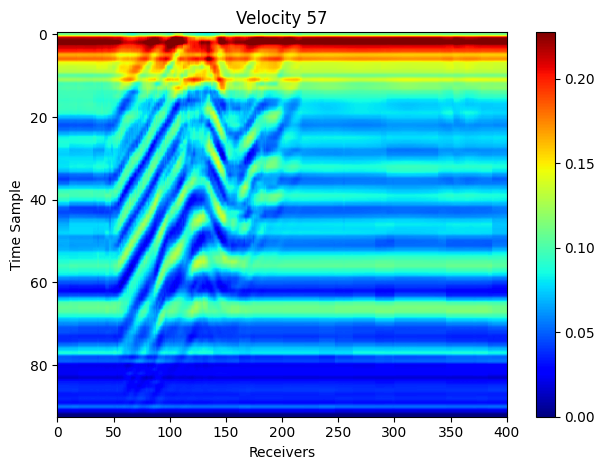

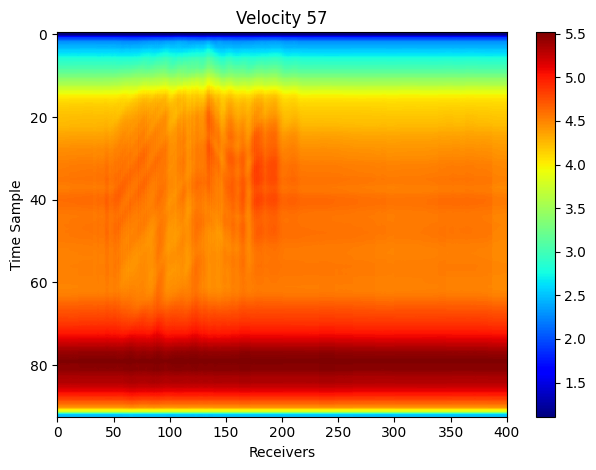

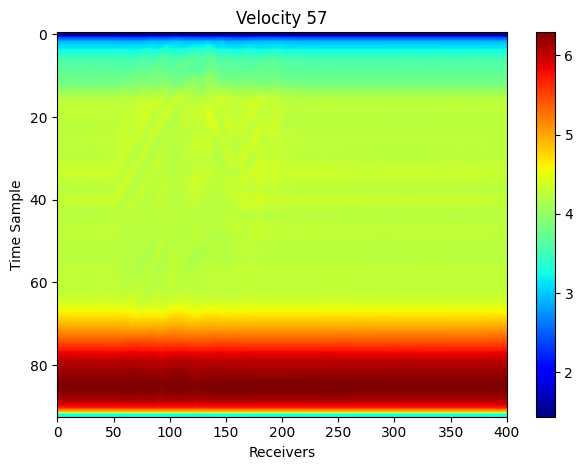

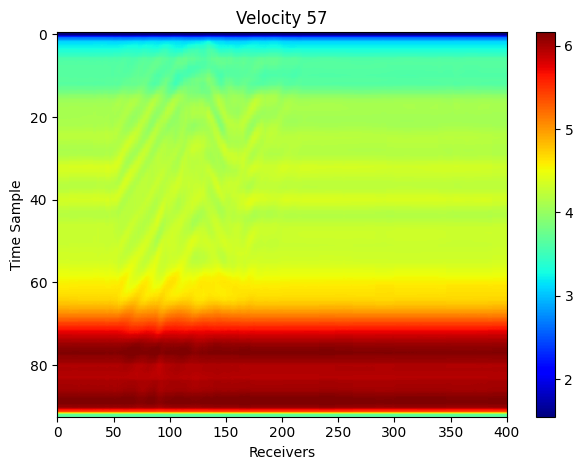

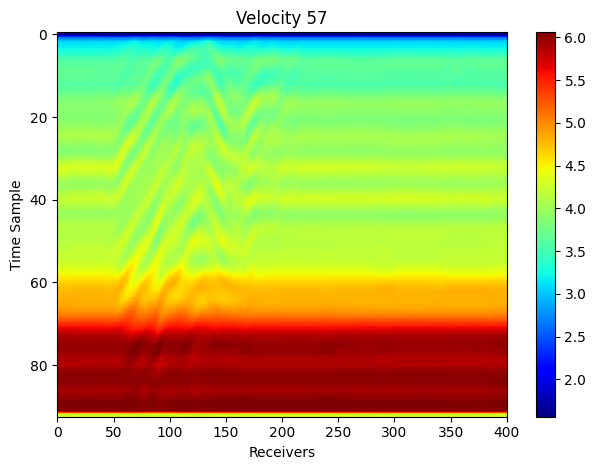

...

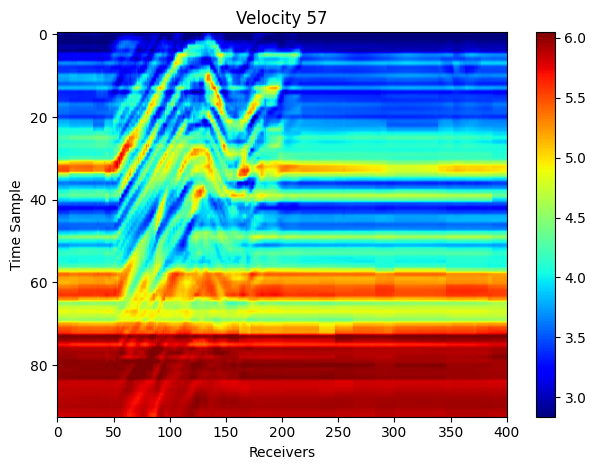

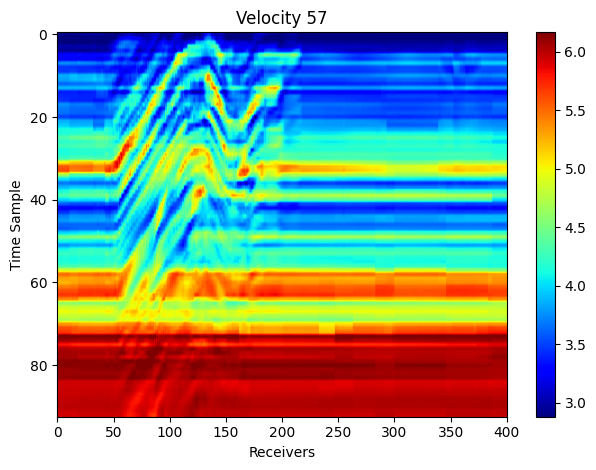

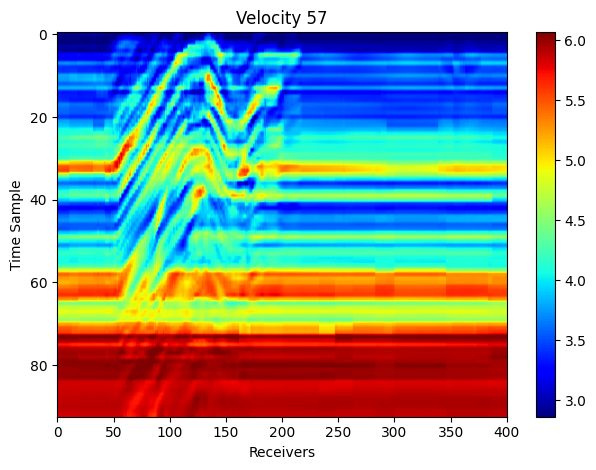

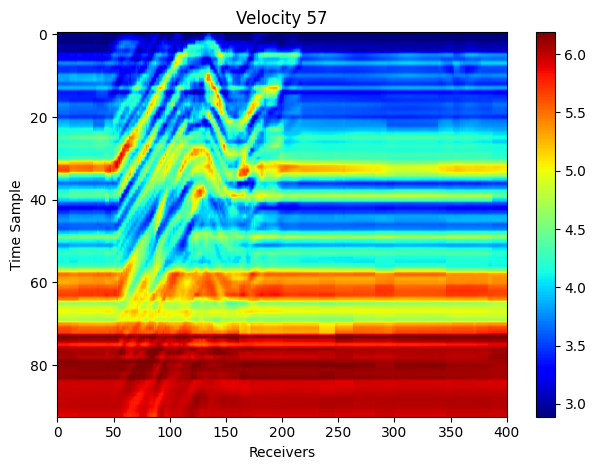

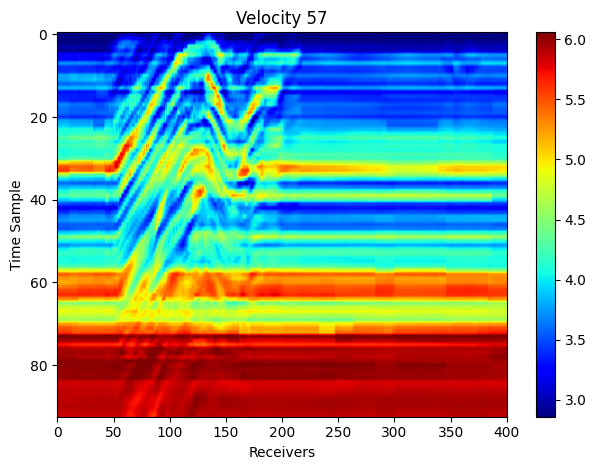

In [8]:
num_epochs = 5000
for epoch in range(num_epochs):
    
    optimizer.zero_grad()
    
    recon_seismic_data, pre_velocity, recon_seismic_data_pre_v, pre_seismic_data, recon_velocity = net(seismic_data.to(device), 
                                                                             pre_seismic_data_label.to(device), 
                                                                             pre_velocity_label.to(device))
    
    loss = (
            loss_fn(recon_seismic_data, seismic_data.to(device)) + 
        
            loss_fn(pre_velocity, pre_velocity_label.to(device)) + 
            loss_fn(recon_seismic_data_pre_v, pre_seismic_data_label.to(device)) + 
        
            loss_fn(pre_seismic_data, pre_seismic_data_label.to(device)) + 
            loss_fn(recon_velocity, pre_velocity_label.to(device))
        )
    loss.backward()
    
    optimizer.step()
    
    if epoch % 50 == 0:
        with torch.no_grad():
            print(epoch,loss.item())
            net.eval()
            
            outputs_val = net.encode(seismic_data.to(device))
            outputs_val = outputs_val.reshape(seismic_data_size[0], seismic_data_size[1], seismic_data_size[2])
            vmin, vmax = torch.quantile(outputs_val[0,:,:].cpu(), torch.tensor([0.01, 0.99]))
            
            plt.figure()
            plt.imshow(outputs_val[0,:,:].T.cpu(), aspect='auto', cmap='jet', vmax=vmax, vmin=vmin)
            plt.xlabel("Receivers")
            plt.ylabel("Time Sample")
            plt.title("Velocity 57")
            plt.colorbar()

            plt.tight_layout()
#             plt.savefig(results_path + str(epoch) + '_pre_velocity_sm.jpg')